# Visualizing COVID-19 Cases with Moving Averages

Let's visualize and animate daily COVID-19 cases using moving averages.

- Simple Moving Average (SMA)
- Cumulative Moving Average (CMA)
- Exponential Moving Average (EMA)

## 1. Data Preparation

### Import Libraries

In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.io as pio

pio.renderers.default = "plotly_mimetype+notebook_connected"

from datetime import date, datetime, timedelta

In [2]:
ndays = 7
dateformat = '%Y-%m-%d'
timestamp = datetime.now().strftime('%Y%m%d%H%M')

### Load Data

In [3]:
dataset_url = 'https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv'
df = pd.read_csv(dataset_url)
df

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-23,Afghanistan,0,0,0
2,2020-01-24,Afghanistan,0,0,0
3,2020-01-25,Afghanistan,0,0,0
4,2020-01-26,Afghanistan,0,0,0
...,...,...,...,...,...
58823,2020-11-20,Zimbabwe,9120,8229,265
58824,2020-11-21,Zimbabwe,9172,8235,265
58825,2020-11-22,Zimbabwe,9220,8250,268
58826,2020-11-23,Zimbabwe,9308,8288,273


In [4]:
df.to_csv('countries-raw-' + timestamp + '.csv', index = False)

### Calculate Daily Cases

In [5]:
firstdate = df['Date'].min()
firstdate

'2020-01-22'

In [6]:
df = df.assign(Cases = np.where(df['Date'] == firstdate, df['Confirmed'], df['Confirmed'].diff()))
df['Cases'] = df['Cases'].astype(int)
df

,Date,Country,Confirmed,Recovered,Deaths,Cases
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-23,Afghanistan,0,0,0,0
2,2020-01-24,Afghanistan,0,0,0,0
3,2020-01-25,Afghanistan,0,0,0,0
4,2020-01-26,Afghanistan,0,0,0,0
...,...,...,...,...,...,...
58823,2020-11-20,Zimbabwe,9120,8229,265,74
58824,2020-11-21,Zimbabwe,9172,8235,265,52
58825,2020-11-22,Zimbabwe,9220,8250,268,48
58826,2020-11-23,Zimbabwe,9308,8288,273,88


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58828 entries, 0 to 58827
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Date       58828 non-null  object
 1   Country    58828 non-null  object
 2   Confirmed  58828 non-null  int64 
 3   Recovered  58828 non-null  int64 
 4   Deaths     58828 non-null  int64 
 5   Cases      58828 non-null  int32 
dtypes: int32(1), int64(3), object(2)
memory usage: 2.5+ MB


### Edit and Remove Columns

In [8]:
df['Date'] = pd.to_datetime(df['Date'], format = dateformat)
df.dtypes

Date         datetime64[ns]
Country              object
Confirmed             int64
Recovered             int64
Deaths                int64
Cases                 int32
dtype: object

In [9]:
df.drop(['Confirmed', 'Recovered', 'Deaths'], axis = 1, inplace = True)
df

,Date,Country,Cases
0,2020-01-22,Afghanistan,0
1,2020-01-23,Afghanistan,0
2,2020-01-24,Afghanistan,0
3,2020-01-25,Afghanistan,0
4,2020-01-26,Afghanistan,0
...,...,...,...
58823,2020-11-20,Zimbabwe,74
58824,2020-11-21,Zimbabwe,52
58825,2020-11-22,Zimbabwe,48
58826,2020-11-23,Zimbabwe,88


### Calculate Moving Averages

In [10]:
countries = df['Country'].unique()
countries

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [11]:
SMAs = []
CMAs = []
EMAs = []

for country in countries:
    df_country = df[df['Country'] == country]
    SMAs.extend(df_country['Cases'].rolling(ndays, min_periods = 1).mean())
    CMAs.extend(df_country['Cases'].expanding().mean())
    EMAs.extend(df_country['Cases'].ewm(alpha = 0.3, adjust = False).mean())

In [12]:
df = df.assign(
    SMA = SMAs,
    CMA = CMAs,
    EMA = EMAs
)

df

,Date,Country,Cases,SMA,CMA,EMA
0,2020-01-22,Afghanistan,0,0.000000,0.000000,0.000000
1,2020-01-23,Afghanistan,0,0.000000,0.000000,0.000000
2,2020-01-24,Afghanistan,0,0.000000,0.000000,0.000000
3,2020-01-25,Afghanistan,0,0.000000,0.000000,0.000000
4,2020-01-26,Afghanistan,0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...
58823,2020-11-20,Zimbabwe,74,50.714286,30.000000,57.724434
58824,2020-11-21,Zimbabwe,52,55.142857,30.072131,56.007104
58825,2020-11-22,Zimbabwe,48,55.857143,30.130719,53.604973
58826,2020-11-23,Zimbabwe,88,58.714286,30.319218,63.923481


### Visualize Countries

In [13]:
def VisualizeCountry(country):
    df_country = df[df['Country'] == country]
    df_country

    colors = ['orange', 'steelblue', 'red', 'purple']
    df_country.plot(x = 'Date', color = colors, linewidth = 1, figsize = (12,6))

    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.legend(labels =['Daily Cases', '7-Day SMA', 'CMA', 'EMA'], fontsize = 14)

    plt.title(f'{country} - Daily COVID-19 Cases and Moving Averages', fontsize = 20)
    plt.xlabel('Date', fontsize = 16)
    plt.ylabel('Cases', fontsize = 16)

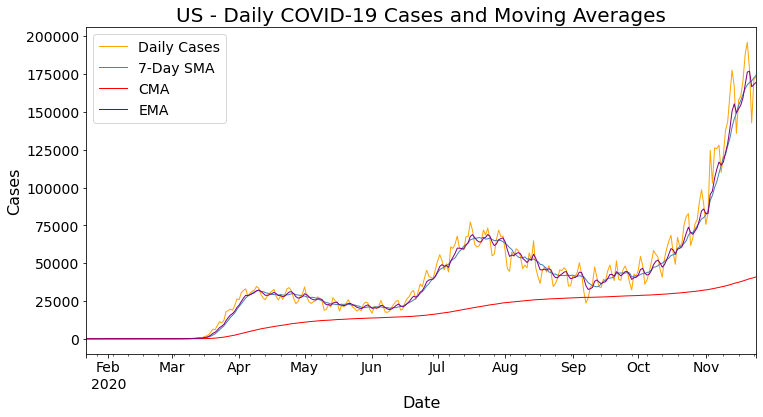

In [14]:
VisualizeCountry('US')

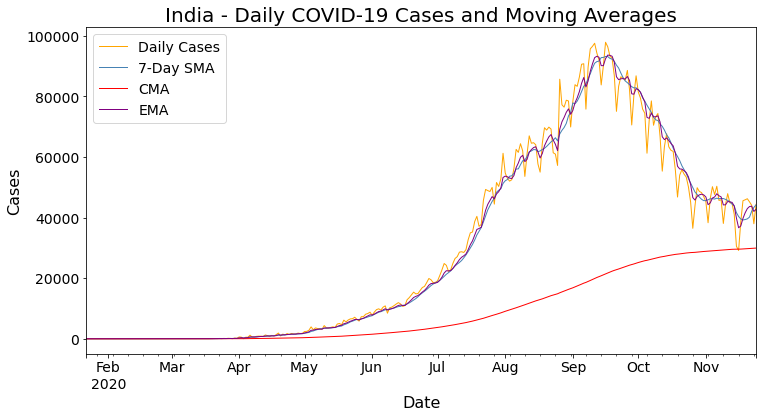

In [15]:
VisualizeCountry('India')

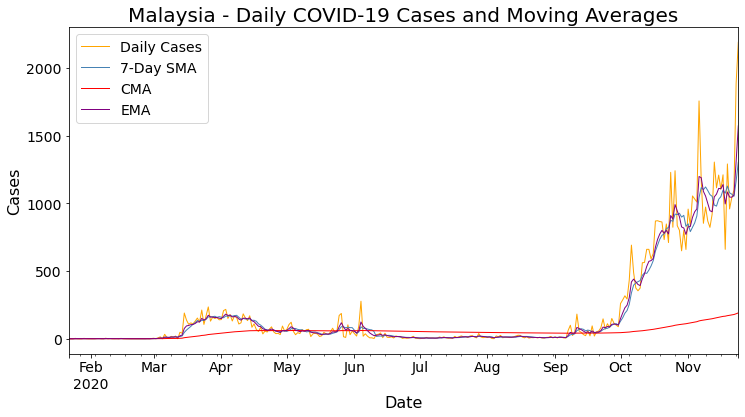

In [16]:
VisualizeCountry('Malaysia')

### Animate World Daily Cases

In [17]:
df['Date'] = df['Date'].astype(str)
df

,Date,Country,Cases,SMA,CMA,EMA
0,2020-01-22,Afghanistan,0,0.000000,0.000000,0.000000
1,2020-01-23,Afghanistan,0,0.000000,0.000000,0.000000
2,2020-01-24,Afghanistan,0,0.000000,0.000000,0.000000
3,2020-01-25,Afghanistan,0,0.000000,0.000000,0.000000
4,2020-01-26,Afghanistan,0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...
58823,2020-11-20,Zimbabwe,74,50.714286,30.000000,57.724434
58824,2020-11-21,Zimbabwe,52,55.142857,30.072131,56.007104
58825,2020-11-22,Zimbabwe,48,55.857143,30.130719,53.604973
58826,2020-11-23,Zimbabwe,88,58.714286,30.319218,63.923481


In [18]:
fig = px.choropleth(df, locations = 'Country', locationmode = 'country names', color = 'SMA', animation_frame = 'Date', width = 800, height = 600)
fig.update_layout(title_text = 'Simple Moving Average - COVID-19 Daily Cases', title_x = 0.5)
fig.show()

In [19]:
fig = px.choropleth(df, locations = 'Country', locationmode = 'country names', color = 'CMA', animation_frame = 'Date', width = 800, height = 600)
fig.update_layout(title_text = 'Cumulative Moving Average - COVID-19 Daily Cases', title_x = 0.5)
fig.show()

In [20]:
fig = px.choropleth(df, locations = 'Country', locationmode = 'country names', color = 'EMA', animation_frame = 'Date', width = 800, height = 600)
fig.update_layout(title_text = 'Exponential Moving Average - COVID-19 Daily Cases', title_x = 0.5)
fig.show()

### Save Data

In [21]:
df.to_csv('countries-' + timestamp + '.csv', index = False)

In [24]:
fig.write_html('averages-' + timestamp + '.html')

In [23]:
fig.write_image('averages-' + timestamp + '.png')